In [1]:
%load_ext autoreload
%autoreload 2

from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import numpy as np
import math
import torch
import pickle as pkl
from tqdm import tqdm
from HPA_CC.data.dataset import DatasetFS
from HPA_CC.utils.pseudotime import intensities_to_pseudotime
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from config import FUCCI_DS_PATH, FUCCI_NAME, OUTPUT_DIR
from multiprocessing import Pool
from argparse import ArgumentParser
from dataset_summary import load_microscopes_wells

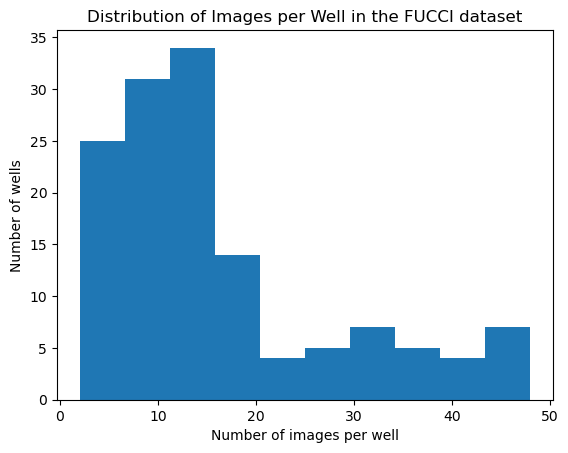

In [2]:
fucci_ds = DatasetFS(FUCCI_DS_PATH)

images_per_well = [len(fucci_ds.images_in_well(well)) for well in fucci_ds.well_list]
plt.hist(images_per_well)
plt.savefig(OUTPUT_DIR / "images_per_well.png")
plt.xlabel("Number of images per well")
plt.ylabel("Number of wells")
plt.title(f"Distribution of Images per Well in the FUCCI dataset")
plt.show()

In [3]:
def process_well(well):
    sc_images = torch.load(well / f"images_{FUCCI_NAME}.pt") # Cells x Channels x H x W
    nuclei_masks = torch.load(well / f"nuclei_masks_{FUCCI_NAME}.pt") # Cells x H x W
    sc_nuclei = sc_images * nuclei_masks[:, None]
    mean_intensities = torch.sum(sc_nuclei[:, 2:], dim=(2, 3)) / torch.sum(nuclei_masks[:, None], dim=(2, 3)) # only calculating for GMNN and CDT1
    min_nonzero_GMNN = torch.min(mean_intensities[:, 0][mean_intensities[:, 0] > 0])
    min_nonzero_CDT1 = torch.min(mean_intensities[:, 1][mean_intensities[:, 1] > 0])
    log_mean_GMNN = torch.log(mean_intensities[:, 0] + min_nonzero_GMNN)
    log_mean_CDT1 = torch.log(mean_intensities[:, 1] + min_nonzero_CDT1)
    log_mean_fucci_intensities = torch.stack((log_mean_GMNN, log_mean_CDT1), dim=1)
    fucci_time, raw_time, well_std_int = intensities_to_pseudotime(log_mean_fucci_intensities.numpy())
    raw_time = raw_time * 2 * np.pi - np.pi
    return len(sc_images), log_mean_fucci_intensities, well_std_int, fucci_time, raw_time

# plot a grid of the polar distrbution of each well
n_wells = len(fucci_ds.well_list)
if (OUTPUT_DIR / "well_intensity_cache.pkl").exists():
    cells_per_well, well_intensities, well_std_int, well_pseudotimes, well_angles = pkl.load(open(OUTPUT_DIR / "well_intensity_cache.pkl", "rb"))
else:
    with Pool(16) as pool:
        results = list(tqdm(pool.imap(process_well, fucci_ds.well_list), total=n_wells, desc="Plotting Pseudotime distributions"))

    cells_per_well, well_intensities, well_std_int, well_pseudotimes, well_angles = zip(*results)
    pkl.dump((cells_per_well, well_intensities, well_std_int, well_pseudotimes, well_angles), open(OUTPUT_DIR / "well_intensity_cache.pkl", "wb"))

Plotting Pseudotime Colors: 100%|██████████| 136/136 [00:06<00:00, 20.45it/s]


<Figure size 640x480 with 0 Axes>

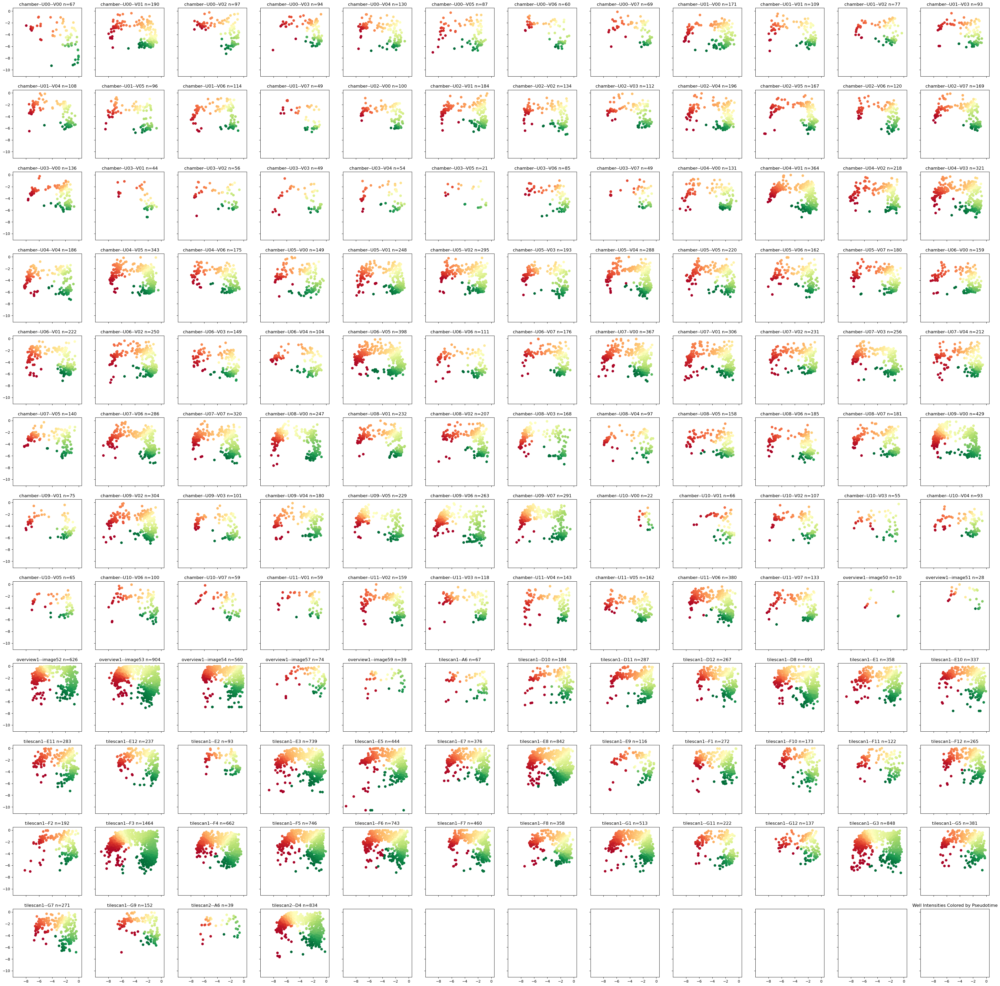

In [14]:
n_col = 12
n_row = math.ceil(n_wells / n_col)
plt.clf()
fig, axes = plt.subplots(n_row, n_col, figsize=(n_col * 4, n_row * 4), sharex=True, sharey=True)
for i, well, cells, intensities, pseudotime in tqdm(zip(range(n_wells), fucci_ds.well_list, cells_per_well, well_intensities, well_pseudotimes), total=n_wells, desc="Plotting Pseudotime Colors"):
    ax = axes[i // n_col, i % n_col]
    ax.set_title(f"{well.name} n={cells}")
    ax.scatter(intensities[:, 0], intensities[:, 1], c=pseudotime, cmap="RdYlGn")
plt.title("Well Intensities Colored by Pseudotime")
plt.show()
plt.close()

<Figure size 640x480 with 0 Axes>

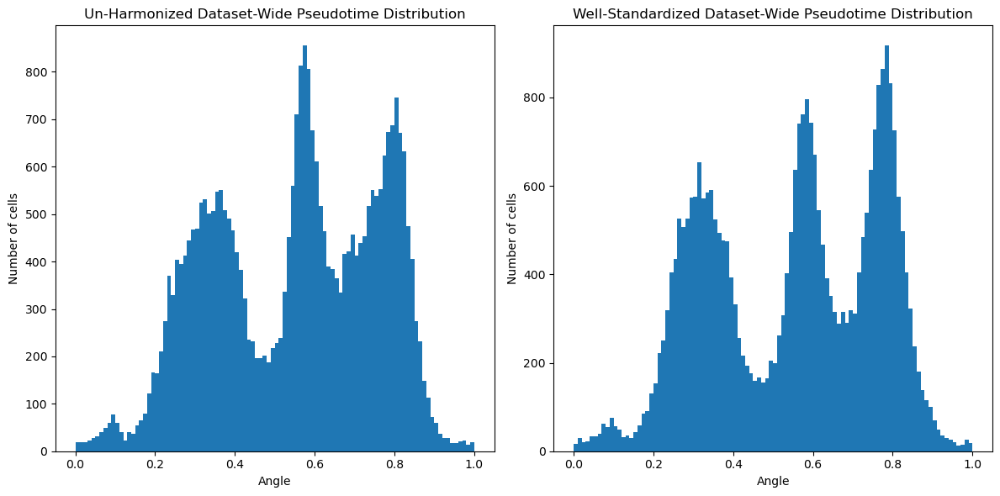

<Figure size 640x480 with 0 Axes>

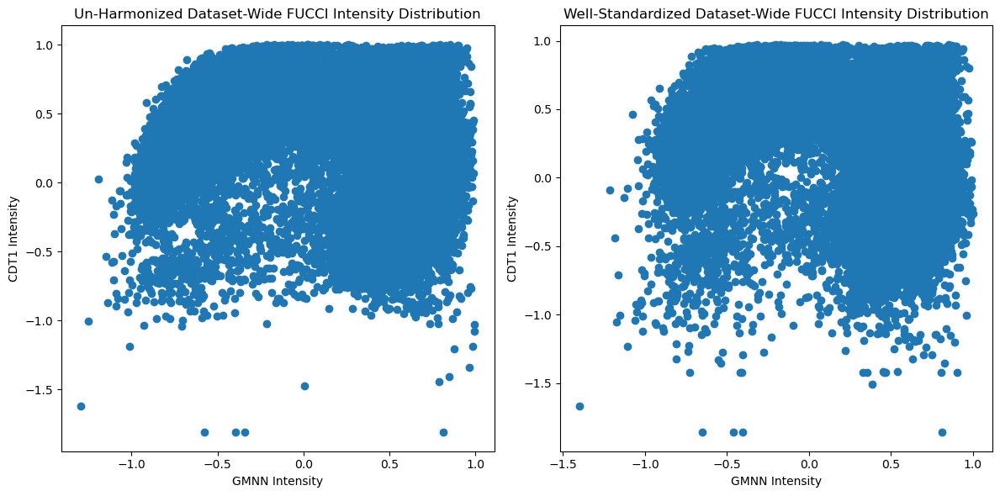

In [15]:
full_time, full_angles, full_std_int = intensities_to_pseudotime(np.concatenate(well_intensities))
std_full_time, std_full_angles, std_full_std_int = intensities_to_pseudotime(np.concatenate(well_std_int), rescale=False)

plt.clf()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
# Plot for full_angles
axes[0].hist(full_angles, bins=100)
axes[0].set_xlabel("Angle")
axes[0].set_ylabel("Number of cells")
axes[0].set_title("Un-Harmonized Dataset-Wide Pseudotime Distribution")

# Plot for std_full_angles
axes[1].hist(std_full_angles, bins=100)
axes[1].set_xlabel("Angle")
axes[1].set_ylabel("Number of cells")
axes[1].set_title("Well-Standardized Dataset-Wide Pseudotime Distribution")

plt.tight_layout()
plt.show()
plt.close()

plt.clf()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
# Plot for std_int
axes[0].scatter(full_std_int[:, 0], full_std_int[:, 1])
axes[0].set_xlabel("GMNN Intensity")
axes[0].set_ylabel("CDT1 Intensity")
axes[0].set_title("Un-Harmonized Dataset-Wide FUCCI Intensity Distribution")

axes[1].scatter(std_full_std_int[:, 0], std_full_std_int[:, 1])
axes[1].set_xlabel("GMNN Intensity")
axes[1].set_ylabel("CDT1 Intensity")
axes[1].set_title("Well-Standardized Dataset-Wide FUCCI Intensity Distribution")

plt.tight_layout()
plt.show()
plt.close()

# Old Well-level Analysis

Plotting FUCCI Curves:  76%|███████▌  | 103/136 [00:57<00:18,  1.81it/s]

Plotting FUCCI Curves: 100%|██████████| 136/136 [01:17<00:00,  1.76it/s]


<Figure size 640x480 with 0 Axes>

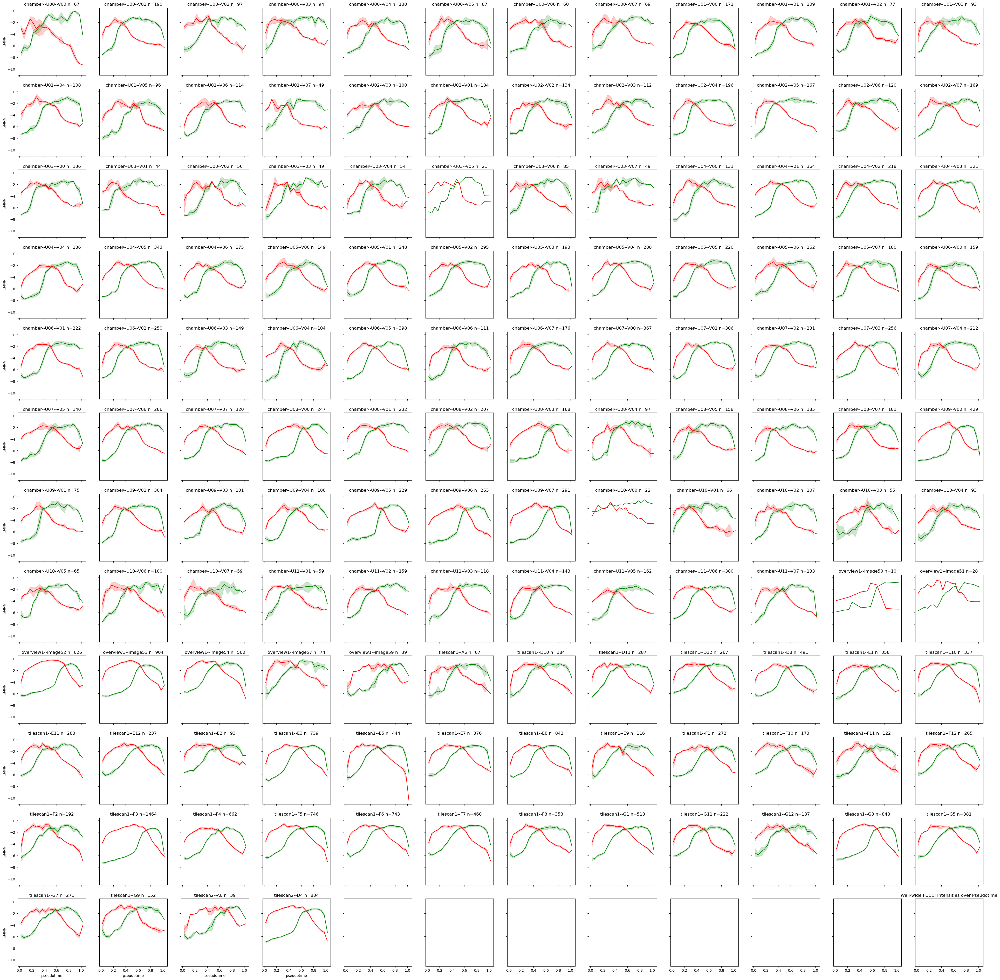

In [5]:
bin_res = 0.05
pseudotime_bins = np.arange(0, 1 + bin_res, bin_res)
n_col = 12
n_row = math.ceil(n_wells / n_col)
plt.clf()
fig, axes = plt.subplots(n_row, n_col, figsize=(n_col * 4, n_row * 4), sharex=True, sharey=True)
for i, well, cells, intensities, pseudotime in tqdm(zip(range(n_wells), fucci_ds.well_list, cells_per_well, well_intensities, well_pseudotimes), total=n_wells, desc="Plotting FUCCI Curves"):
    binned_pseudotime = (np.digitize(pseudotime, pseudotime_bins) - 0.5) * bin_res
    well_df = pd.DataFrame({"GMNN": intensities[:, 0], "CDT1": intensities[:, 1], "pseudotime": binned_pseudotime})
    ax = axes[i // n_col, i % n_col]
    ax.set_title(f"{well.name} n={cells}")
    sns.lineplot(x="pseudotime", y="GMNN", data=well_df, ax=ax, color="green")
    sns.lineplot(x="pseudotime", y="CDT1", data=well_df, ax=ax, color="red")
plt.title("Well-wide FUCCI Intensities over Pseudotime")
plt.show()
plt.close()

Plotting Angular Distributions: 100%|██████████| 136/136 [00:15<00:00,  8.56it/s]


<Figure size 640x480 with 0 Axes>

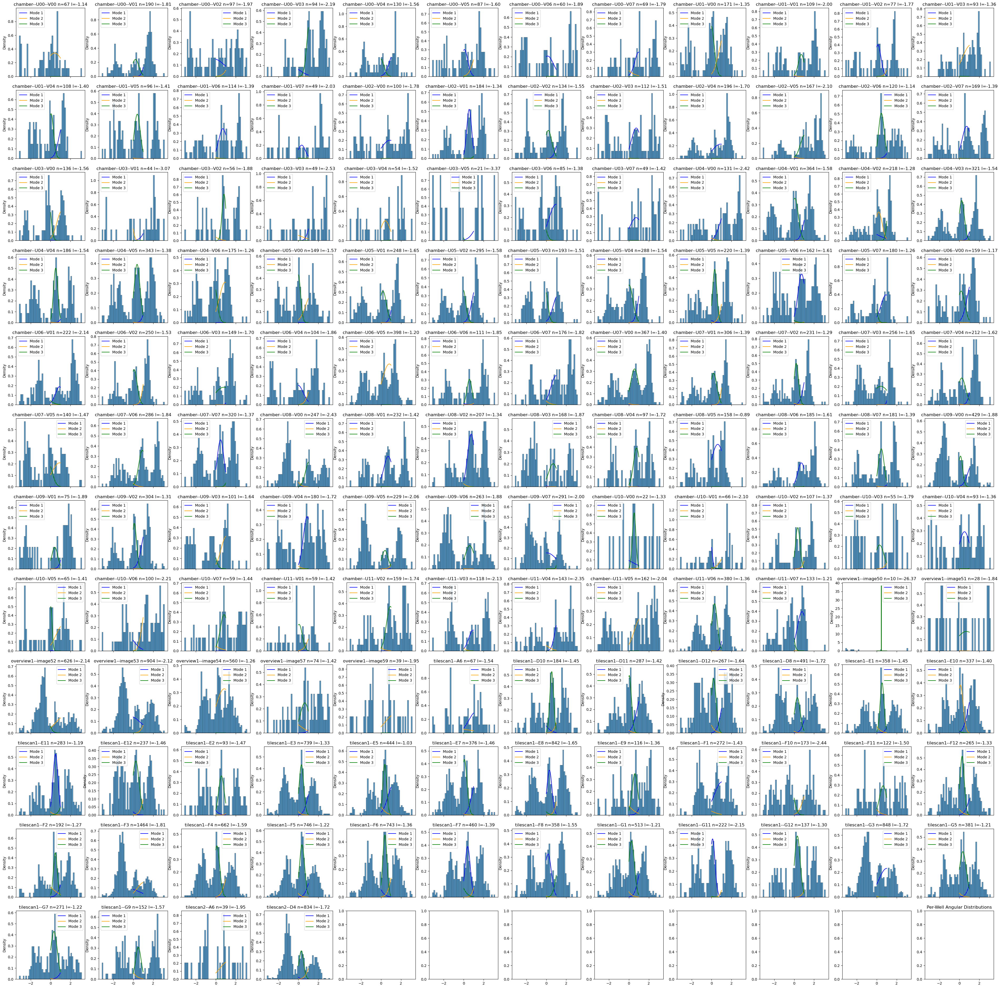

In [7]:

n_col = 12
n_row = math.ceil(n_wells / n_col)
plt.clf()
fig, axes = plt.subplots(n_row, n_col, figsize=(n_col * 4, n_row * 4), sharex=True, sharey=False)
gmm_well_params = []
sample_classes = []
for i, well, cells, intensities, angles in tqdm(zip(range(n_wells), fucci_ds.well_list, cells_per_well, well_intensities, well_angles), total=n_wells, desc="Plotting Angular Distributions"):
    ax = axes[i // n_col, i % n_col]
    ax.set_title(f"{well.name} n={cells}")
    sns.histplot(angles, ax=ax, kde=False, stat="density", bins=50)

    gmm = GaussianMixture(n_components=3, covariance_type='spherical', n_init=10, init_params='k-means++')
    gmm.fit(angles.reshape(-1, 1))

    x = np.linspace(0, 1, 1000)
    y = np.exp(gmm._estimate_weighted_log_prob(x.reshape(-1, 1)))

    ax.plot(x, y[:, 0].flatten(), color='blue', label='Mode 1')
    ax.plot(x, y[:, 1].flatten(), color='orange', label='Mode 2')
    ax.plot(x, y[:, 2].flatten(), color='green', label='Mode 3')

    likelihood = np.mean(gmm.score_samples(x.reshape(-1, 1)))
    ax.set_title(f"{well.name} n={cells} l={likelihood:.2f}")
    ax.legend()

    weights, means, vars = gmm.weights_.copy(), gmm.means_.flatten().copy(), gmm.covariances_.flatten().copy()
    # Sort the Gaussian components by means
    sorted_indices = np.argsort(means)
    weights = weights[sorted_indices]
    means = means[sorted_indices]
    vars = vars[sorted_indices]

    gmm_well_params.append(np.concatenate([weights, means, vars]))
    sample_classes.append(np.argmax(gmm._estimate_weighted_log_prob(angles.reshape(-1, 1))[:, sorted_indices], axis=1))
plt.title("Per-Well Angular Distributions")
plt.show()
plt.close()

Plotting Sample Classes: 100%|██████████| 136/136 [00:06<00:00, 20.61it/s]


<Figure size 640x480 with 0 Axes>

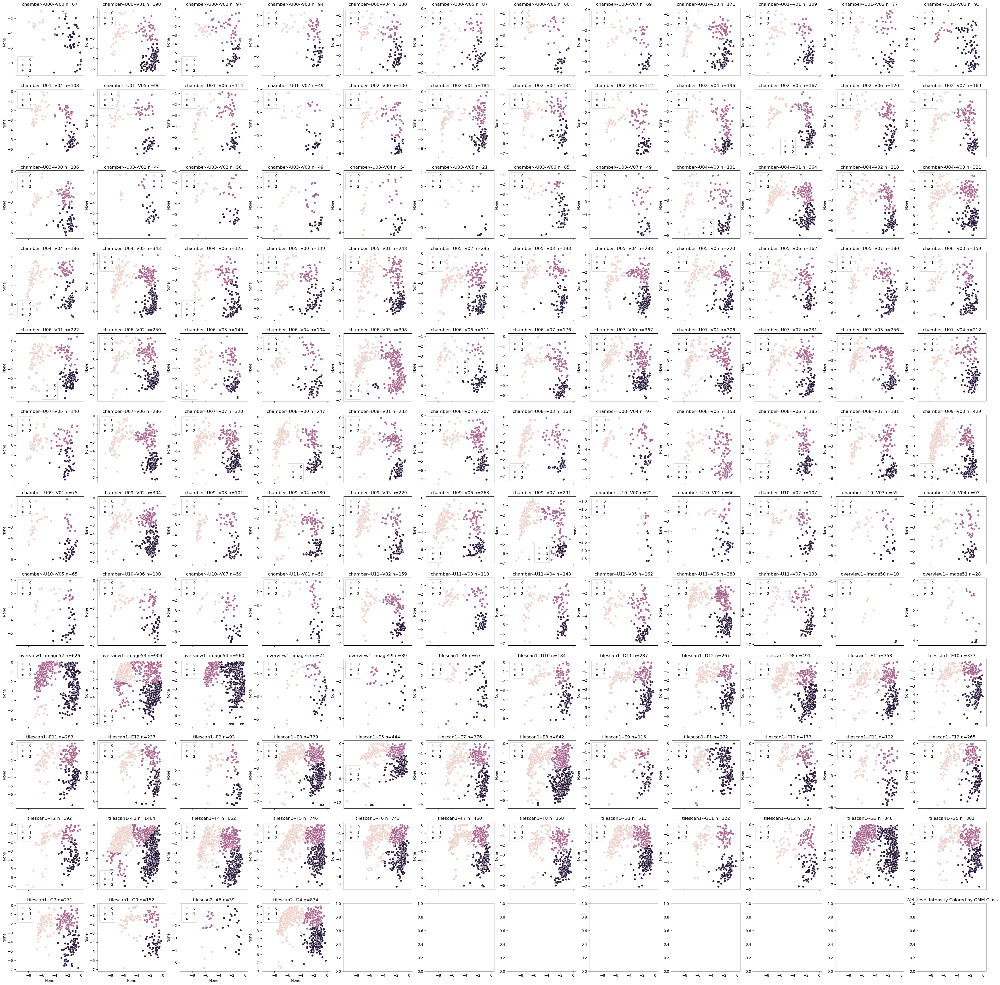

In [8]:
n_col = 12
n_row = math.ceil(n_wells / n_col)
plt.clf()
fig, axes = plt.subplots(n_row, n_col, figsize=(n_col * 4, n_row * 4), sharex=True, sharey=False)
for i, well, cells, intensities, angles, sample_class in tqdm(zip(range(n_wells), fucci_ds.well_list, cells_per_well, well_intensities, well_angles, sample_classes), total=n_wells, desc="Plotting Sample Classes"):
    ax = axes[i // n_col, i % n_col]
    ax.set_title(f"{well.name} n={cells}")
    sns.scatterplot(x=intensities[:, 0], y=intensities[:, 1], hue=sample_class, ax=ax)
plt.title("Well-level Intensity Colored by GMM Class")
plt.show()
plt.close()

In [9]:
gmm_well_params = np.array(gmm_well_params)
print("Cluster Mean and Medians")
print("Mean:\t", np.mean(gmm_well_params, axis=0))
print("StdDev:\t", np.std(gmm_well_params, axis=0))
print("Median:\t", np.median(gmm_well_params, axis=0))
pca = PCA(n_components=2)
pca_result = pca.fit_transform(gmm_well_params)
print(pca.explained_variance_ratio_)

Cluster Mean and Medians
Mean:	 [ 0.31845173  0.29477791  0.38677037 -1.69663788  0.28921513  1.79884612
  0.38100994  0.19835631  0.21799835]
StdDev:	 [0.0983756  0.09255788 0.10501622 0.49902746 0.53395631 0.51763777
 0.25403055 0.31299911 0.16901125]
Median:	 [ 0.31913081  0.28553848  0.37963447 -1.63677786  0.32762653  1.74169662
  0.33562886  0.10880226  0.18016726]
[0.60304811 0.19628945]


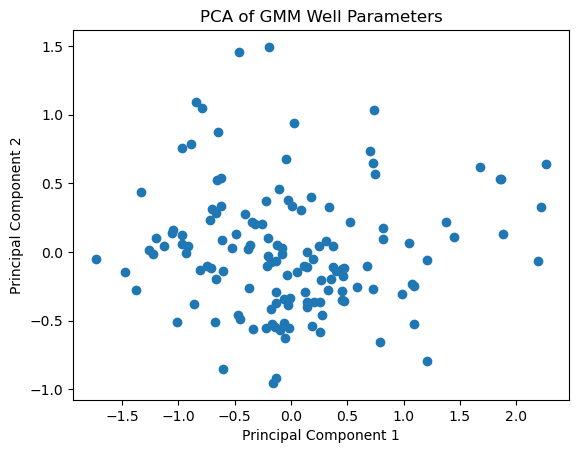

In [10]:
plt.scatter(pca_result[:, 0], pca_result[:, 1])
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA of GMM Well Parameters")
plt.show()
plt.close()

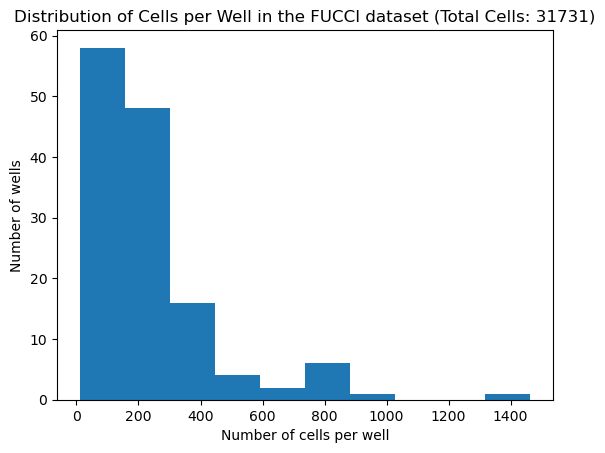

chamber--U01--V04


In [11]:
total_cells = np.sum(cells_per_well)
plt.hist(cells_per_well)
plt.xlabel("Number of cells per well")
plt.ylabel("Number of wells")
plt.title(f"Distribution of Cells per Well in the FUCCI dataset (Total Cells: {total_cells})")
plt.show()
plt.close()

microscopes, wells = load_microscopes_wells()
print(wells[np.argmax(cells_per_well)])

In [16]:
scopes = set([well.name.split("--")[0] for well in fucci_ds.well_list])
scope_gmms = {s: GaussianMixture(n_components=3, covariance_type='spherical', n_init=10, init_params='k-means++') for s in scopes}
scope_angles = {s: [] for s in scopes}
scope_mode_order = {}
for i, well, angles in tqdm(zip(range(n_wells), fucci_ds.well_list, well_angles), total=n_wells, desc="Collect well-level angles"):
    scope = well.name.split("--")[0]
    scope_angles[scope].append(angles)
for scope in tqdm(scopes, desc="Fit GMMs"):
    scope_angles[scope] = np.concatenate(scope_angles[scope])
    scope_gmms[scope].fit(scope_angles[scope].reshape(-1, 1))
    scope_mode_order[scope] = np.argsort(scope_gmms[scope].means_.flatten())
scope_sample_classes = []
for i, well, angles in tqdm(zip(range(n_wells), fucci_ds.well_list, well_angles), total=n_wells, desc="Predicting Scope-level Sample Classes"):
    scope = well.name.split("--")[0]
    sample_class = np.argmax(scope_gmms[scope]._estimate_weighted_log_prob(angles.reshape(-1, 1))[:, scope_mode_order[scope]], axis=1)
    scope_sample_classes.append(sample_class)

Predicting Scope-level Sample Classes: 100%|██████████| 136/136 [00:00<00:00, 16036.25it/s]


In [17]:
n_col = 12
n_row = math.ceil(n_wells / n_col)
plt.clf()
fig, axes = plt.subplots(n_row, n_col, figsize=(n_col * 4, n_row * 4), sharex=True, sharey=False)
for i, well, cells, intensities, angles, scope_class, sample_class in tqdm(zip(range(n_wells), fucci_ds.well_list, cells_per_well, well_intensities, well_angles, scope_sample_classes, sample_classes), total=n_wells, desc="Plotting Scope-level Sample Classes"):
    ax = axes[i // n_col, i % n_col]
    sns.scatterplot(x=intensities[:, 0], y=intensities[:, 1], hue=scope_class, ax=ax)
    diff_sample_idxs = (sample_class != scope_class)
    ax.scatter(intensities[diff_sample_idxs, 0], intensities[diff_sample_idxs, 1], marker='x', color='red', alpha=0.2)
    ax.set_title(f"{well.name} n={cells}, error={np.sum(diff_sample_idxs)}")
plt.title("Well-level Intensity Colored by Scope GMM Class")
plt.show()
plt.close()

# Save scope and well sample classes and gmms to file
pkl.dump((scope_sample_classes, sample_classes, scope_gmms), open(OUTPUT_DIR / "sample_classes_gmms.pkl", "wb"))

Plotting Scope-level Sample Classes:   9%|▉         | 12/136 [00:00<00:07, 16.51it/s]

Plotting Scope-level Sample Classes: 100%|██████████| 136/136 [00:09<00:00, 14.65it/s]


<Figure size 640x480 with 0 Axes>